<a href="https://colab.research.google.com/github/osunrinde/DSN/blob/main/CORE_IMAGES_CLASSIFICATION.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
#Importing the necessary libraries needed for this project
%matplotlib inline
import pandas as pd
import os
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import zipfile
from PIL import Image, ImageFilter
from sklearn.model_selection import StratifiedShuffleSplit, cross_val_score, RandomizedSearchCV,StratifiedKFold
from IPython.display import display
import glob
import math
import tensorflow as tf
import keras
from keras.wrappers.scikit_learn import KerasClassifier
from keras.models import Sequential
from keras.preprocessing import image
from keras.utils.np_utils import to_categorical
from keras.layers import Dense,Dropout,Activation
import tensorflow as tf
from keras.models import Sequential
from keras.layers import Dense,Dropout,Activation, Flatten, Input, concatenate,BatchNormalization
from keras.callbacks import EarlyStopping
from tensorflow.keras import optimizers, metrics
from tensorflow.keras.losses import sparse_categorical_crossentropy, categorical_crossentropy
from keras.utils.vis_utils import plot_model
from sklearn.metrics import classification_report, confusion_matrix

import cv2

seed=1234


# DATA LOADING

The first step involve in this project is to successfully load the data (images and csv file) that will be used 

## IMAGE LABEL LOADING

In [ ]:
#importing train data label

train_data_label= pd.read_csv(r"S:\EL NINO\Geology\03. MODELING\TAIWO\TRAIN_LABEL.csv")

In [ ]:
#renaming the ID column in the csv file to fit the image labeling
train_data_label['ID']=train_data_label['ID'] .apply(str)+'.jpg'

## IMAGE LABEL VISUALIZATION

In [ ]:
train_data_label.head()

,ID,Label
0,A.jpg,MBX
1,B.jpg,MBX
2,C.jpg,FBX
3,D.jpg,FBX
4,E.jpg,S3BX


In [ ]:
y=train_data_label['Label']

## IMAGE LOADING

In [ ]:
#The code below is to ensure that the images are loaded serially according to its label
list_id=train_data_label.ID.to_list()
OldFolder1=r"S:\EL NINO\Geology\03. MODELING\TAIWO\ELINO-TRAIN IMAGES"
count=1
for file_name in list_id :
    if file_name in os.listdir(OldFolder1):
        source=os.path.join(OldFolder1, file_name)
        destination= OldFolder1 + "img_" + str(count).zfill(4) + ".jpg"
        os.rename(source, destination)
        count +=1

In [ ]:
"""
The next step is to write a function that can load every data in the image folder and save them to a list
"""
def LOAD_CORE_IMAGES(imagepath):
    Full_image_data = []
    for i in glob.glob(path):
        images=Image.open(i)
        Full_image_data.append(images)
    return Full_image_data
    

In [ ]:
imagepath=r"S:\EL NINO\Geology\03. MODELING\TAIWO\ELINO-TRAIN IMAGES/*.jpg"
Core_images=LOAD_CORE_IMAGES(imagepath)
Core_images[1].filename

'S:\\EL NINO\\Geology\\03. MODELING\\TAIWO\\ELINO-TRAIN IMAGES\\ELINO-TRAIN IMAGESimg_0002.jpg'

## IMAGE VISUALIZATION

In [ ]:
"""
The next step is to write a function that can display the images 
"""
        
def DISPLAY_CORE_IMAGES(data):
    n_cols=6
    n_rows=math.ceil((len(data))/n_cols)
    plt.figure(figsize=(n_cols*4, n_rows*4))
    for j, display_image in enumerate(data):
        plt.subplot(n_rows,n_cols, j+1)
        plt.subplots_adjust(hspace=0.5, wspace=0.5)
        plt.title(y[j], fontsize=15)
        plt.axis()
        plt.imshow(display_image, cmap='binary')   
            

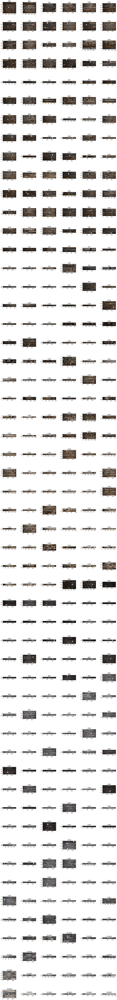

In [ ]:
#displaying all train images
DISPLAY_CORE_IMAGES(Core_images)

# DATA PREPROCESSING

## Image Filtering

In [ ]:
#The code below enhance the input images

Enhanced_images=[]
for i in Core_images:
    filtered=i.filter(ImageFilter.SHARPEN)
    Enhanced_images.append(filtered)
Sharp_images=Enhanced_images


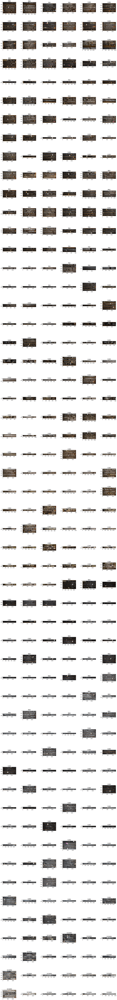

In [ ]:
#displaying the enhanced images
DISPLAY_CORE_IMAGES(Sharp_images)

In [ ]:
#Showing the effect of the filtering

Core_images[307].crop((300, 300, 500, 500)).show()
Sharp_images[307].crop((300, 300, 500, 500)).show()

In [ ]:
#The code below is used to convert the RGB images into greyscale images. 

"""
RGB Images are 3 dimensional matrix while grayscale images is of only 2 dimensions with values ranges between 0–255 
(8-bit unsigned integers). Most algorithm in ML performs better with 2-D matrix. Hence the need to convert the images from 
RGB to greyscale
"""
Greyscaled_images=[]
for i in Sharp_images:
    filtered=i.convert('L')
    Greyscaled_images.append(filtered)
Grey_images=Greyscaled_images



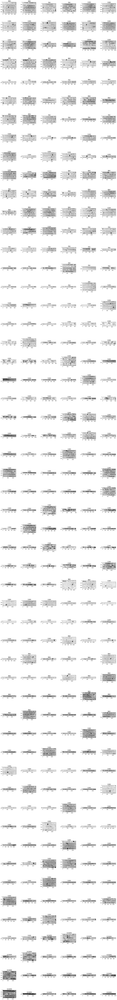

In [ ]:
#displaying all Grey scale images
DISPLAY_CORE_IMAGES(Grey_images)

## Image Resizing

In [ ]:
"""
The next step is to write a function that can resize the images and save them to a list
"""       
        
def image_resizing(Grey_core_images, height, width):
    Resized_core_images=[]
    for core in range(len(Grey_core_images)):
        a=Grey_core_images[core].resize((height, width))
        Resized_core_images.append(a)
    Grey_core_images=Resized_core_images
    return Grey_core_images

In [ ]:
#resizing the core images
Resize_image=image_resizing(Grey_images, 256,256)
Resize_image[1].size

(256, 256)

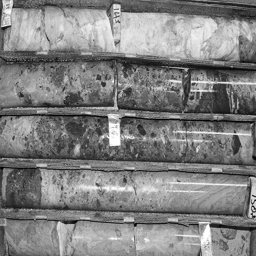

In [ ]:
Resize_image[318]

## Image Pixel to Array

In [ ]:
"""
Converting the images into numerical array for ML development
"""       

Core_arr=[]
for i in range(len(Resize_image)):
    Core_arr.append(np.asarray(Resize_image[i]))
    X_images= np.array(Core_arr)

In [ ]:
X_images

array([[[ 38,  41,  41, ..., 137, 114, 226],
        [ 35,  75, 104, ..., 137, 113, 224],
        [ 42,  57,  74, ..., 133, 113, 225],
        ...,
        [ 34,  34,  38, ...,  92,  91, 226],
        [ 31,  31,  35, ...,  98,  88, 226],
        [ 33,  32,  36, ...,  97,  93, 227]],

       [[113,  66,  64, ...,  35,  92, 104],
        [116,  68,  81, ...,  35,  92, 102],
        [111,  64,  47, ...,  35,  89, 100],
        ...,
        [ 32,  31,  28, ...,  98,  87,  86],
        [ 30,  28,  26, ...,  90, 101,  87],
        [ 21,  24,  25, ...,  36,  80,  86]],

       [[110, 123, 139, ...,  60,  98, 105],
        [106, 121, 140, ...,  56, 100,  98],
        [104, 120, 137, ...,  60,  99,  90],
        ...,
        [ 32,  42,  53, ...,  35, 112, 132],
        [ 32,  42,  50, ...,  37, 119, 134],
        [ 34,  42,  48, ...,  35, 110, 128]],

       ...,

       [[ 84,  73, 103, ..., 109,  80,  85],
        [ 91,  81, 101, ..., 107,  71,  68],
        [103,  96,  98, ..., 102,  53,  35

## Image Normalization

In [ ]:
#normalizing the image array between 0-1 to ensure data is ready for ML
X_images_Norm=X_images/255
X_images_Norm.shape

(324, 256, 256)

In [ ]:
X_images_Norm

array([[[0.14901961, 0.16078431, 0.16078431, ..., 0.5372549 ,
         0.44705882, 0.88627451],
        [0.1372549 , 0.29411765, 0.40784314, ..., 0.5372549 ,
         0.44313725, 0.87843137],
        [0.16470588, 0.22352941, 0.29019608, ..., 0.52156863,
         0.44313725, 0.88235294],
        ...,
        [0.13333333, 0.13333333, 0.14901961, ..., 0.36078431,
         0.35686275, 0.88627451],
        [0.12156863, 0.12156863, 0.1372549 , ..., 0.38431373,
         0.34509804, 0.88627451],
        [0.12941176, 0.1254902 , 0.14117647, ..., 0.38039216,
         0.36470588, 0.89019608]],

       [[0.44313725, 0.25882353, 0.25098039, ..., 0.1372549 ,
         0.36078431, 0.40784314],
        [0.45490196, 0.26666667, 0.31764706, ..., 0.1372549 ,
         0.36078431, 0.4       ],
        [0.43529412, 0.25098039, 0.18431373, ..., 0.1372549 ,
         0.34901961, 0.39215686],
        ...,
        [0.1254902 , 0.12156863, 0.10980392, ..., 0.38431373,
         0.34117647, 0.3372549 ],
        [0.1

## Label Compatible with Data

In [ ]:
y.unique()

array(['MBX', 'FBX', 'S3BX', 'CAVBX', 'S2BX', 'NBX', 'S1BX', 'C2BX',
       'C1BX', 'SCAVBX'], dtype=object)

## Encoding Target 

In [ ]:
from sklearn.preprocessing import LabelEncoder

Label_enconder= LabelEncoder()
Label_enconder.fit(y)
Encoded_label=Label_enconder.transform(y)
Encoded_label

array([4, 4, 3, 3, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 2, 2, 7, 5, 5, 5, 5,
       5, 5, 3, 3, 3, 3, 5, 5, 5, 5, 4, 4, 4, 4, 4, 4, 3, 3, 3, 3, 6, 6,
       6, 6, 6, 7, 7, 7, 7, 7, 7, 7, 7, 2, 2, 5, 5, 5, 5, 5, 5, 4, 4, 4,
       4, 4, 4, 4, 4, 6, 6, 6, 6, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3,
       3, 3, 3, 3, 3, 3, 3, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6,
       6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6,
       6, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 5, 5, 8, 8, 8, 8, 8, 8, 8,
       8, 6, 6, 6, 6, 6, 6, 8, 8, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4,
       4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 8, 8, 8, 8, 8, 8,
       8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8,
       8, 8, 8, 8, 8, 8, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7,
       7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 6, 6, 6, 6, 6,

In [ ]:
classes=np.unique(Encoded_label)
classes

array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9])

In [ ]:
print(Label_enconder.classes_)

['C1BX' 'C2BX' 'CAVBX' 'FBX' 'MBX' 'NBX' 'S1BX' 'S2BX' 'S3BX' 'SCAVBX']


In [ ]:
labels=Label_enconder.classes_.tolist()
labels

['C1BX',
 'C2BX',
 'CAVBX',
 'FBX',
 'MBX',
 'NBX',
 'S1BX',
 'S2BX',
 'S3BX',
 'SCAVBX']

In [ ]:
labels_dict = dict(zip(Label_enconder.classes_, classes))
labels_dict

{'C1BX': 0,
 'C2BX': 1,
 'CAVBX': 2,
 'FBX': 3,
 'MBX': 4,
 'NBX': 5,
 'S1BX': 6,
 'S2BX': 7,
 'S3BX': 8,
 'SCAVBX': 9}

In [ ]:
y_label=y.replace(labels_dict) 

y_label

0      4
1      4
2      3
3      3
4      8
      ..
319    9
320    9
321    9
322    9
323    9
Name: Label, Length: 324, dtype: int32

In [ ]:
y_label.values.astype(int)  

array([4, 4, 3, 3, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 2, 2, 7, 5, 5, 5, 5,
       5, 5, 3, 3, 3, 3, 5, 5, 5, 5, 4, 4, 4, 4, 4, 4, 3, 3, 3, 3, 6, 6,
       6, 6, 6, 7, 7, 7, 7, 7, 7, 7, 7, 2, 2, 5, 5, 5, 5, 5, 5, 4, 4, 4,
       4, 4, 4, 4, 4, 6, 6, 6, 6, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3,
       3, 3, 3, 3, 3, 3, 3, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6,
       6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6,
       6, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 5, 5, 8, 8, 8, 8, 8, 8, 8,
       8, 6, 6, 6, 6, 6, 6, 8, 8, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4,
       4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 8, 8, 8, 8, 8, 8,
       8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8,
       8, 8, 8, 8, 8, 8, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7,
       7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 6, 6, 6, 6, 6,

In [ ]:
from tensorflow.keras.utils import to_categorical

encoded_labels = to_categorical(y_label, num_classes=10, dtype='float32' )
encoded_labels

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 1.],
       [0., 0., 0., ..., 0., 0., 1.],
       [0., 0., 0., ..., 0., 0., 1.]], dtype=float32)

# DATA SPLITTING

In [ ]:
#using stratified method to split the train_data into 80% train and 20% test
seed=1234
from sklearn.model_selection import train_test_split
X_train_images, X_test_images, y_train, y_test= train_test_split(X_images_Norm, encoded_labels, test_size=0.2, random_state=seed, stratify=encoded_labels)


In [ ]:
#Splitting train images into 80% train and 20% Val

X_train_images, X_val_images, y_train, y_val = train_test_split(X_train_images, y_train, test_size=0.2, random_state=seed, stratify=y_train1)

In [ ]:
#Printing the shape of the split data set
print('X_train shape', X_train_images.shape)
print('X_test shape', X_test_images.shape)
print('X_validation shape', X_val_images.shape)
print('y_train shape', y_train.shape)
print('y_test shape', y_test.shape)
print('y_validation shape', y_val.shape)